<div style="background:#161920;color:#F7FAFC;padding:32px 36px;border-radius:16px;border-top:5px solid #35B1B7;font-family:Outfit,Arial,sans-serif">
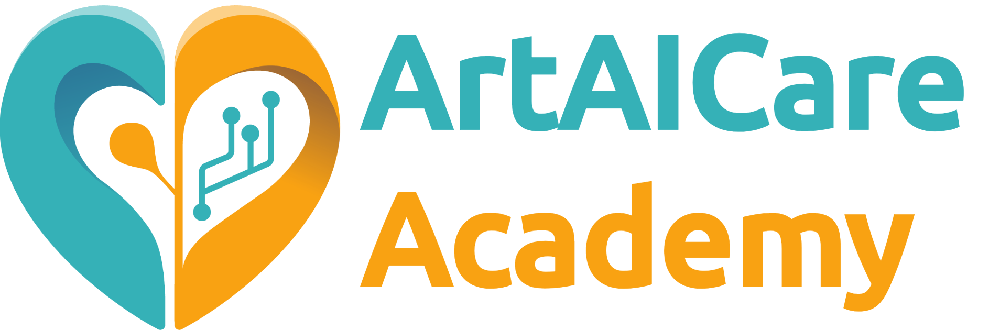
<h1 style="color:#F7FAFC;font-size:36px;line-height:1.15;margin:0 0 14px">Visual Art Recommendation</h1>
<p style="font-size:19px;color:#AEE0E2;margin:0">Find similar paintings with pretrained image embeddings</p>
</div>

A painting can be a search query. In this notebook, you will turn a small collection of **96 real paintings** into image embeddings, explore a visual cloud, and find the five nearest paintings to any selected work.

**The path:** paintings → pretrained ResNet18 → 512 numbers per image → visual cloud → visual groups → similar paintings.

The recommendation uses the **image alone**. Titles, artists and dates make the results readable, but never enter the model or the similarity calculation. There is no training step and no personal preference data.

**You will learn to:** extract image features with PyTorch, calculate cosine similarity, interpret a two-dimensional projection, and build a small interactive image search.

In Google Colab, choose **Runtime → Run all**. The notebook downloads its own painting collection and pretrained weights, then builds every result automatically. The default CPU runtime is sufficient. No dataset upload, API key, or configuration is needed. Internet access is needed on the first run.

<table style="width:100%;background:#161920;border:0;margin:12px 0"><tr><td style="width:25%;padding:8px;vertical-align:top;text-align:center">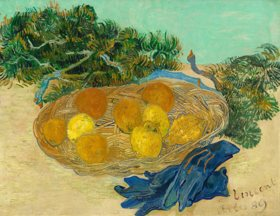<div style="color:#BFC8D8;font-size:12px;margin-top:8px">Vincent van Gogh</div></td><td style="width:25%;padding:8px;vertical-align:top;text-align:center">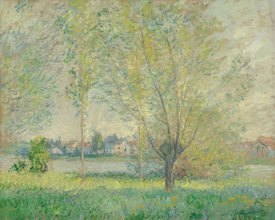<div style="color:#BFC8D8;font-size:12px;margin-top:8px">Claude Monet</div></td><td style="width:25%;padding:8px;vertical-align:top;text-align:center">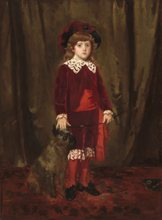<div style="color:#BFC8D8;font-size:12px;margin-top:8px">Mary Cassatt</div></td><td style="width:25%;padding:8px;vertical-align:top;text-align:center">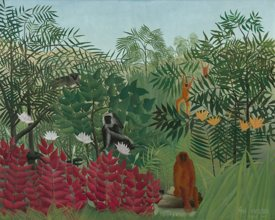<div style="color:#BFC8D8;font-size:12px;margin-top:8px">Henri Rousseau</div></td></tr></table>

### Before you run
In **Google Colab**, choose **Runtime → Run all**. The default CPU runtime is sufficient. The notebook installs its dependencies and downloads its painting images and pretrained weights automatically. No dataset upload, account key or runtime configuration is needed. The first run needs an internet connection.

The core lesson uses PyTorch. The short setup cells below handle downloads and drawing; the model and similarity calculations remain visible in the lesson.

In [2]:
# Install missing packages. Colab reuses its existing PyTorch installation.
%pip -q install torch torchvision numpy pandas matplotlib pillow requests scikit-learn plotly ipywidgets tqdm


[notice] A new release of pip is available: 24.0 -> 26.2.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [3]:
from pathlib import Path
import json
import textwrap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
import torch
from torch import nn
from torchvision.models import resnet18, ResNet18_Weights
from IPython.display import display, HTML, clear_output
import ipywidgets as widgets

SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
# A small thread count keeps CPU execution responsive on a shared runtime.
torch.set_num_threads(min(4, torch.get_num_threads()))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device: {device} | PyTorch {torch.__version__}")

BG, TEAL, AMBER = "#161920", "#35B1B7", "#F9A212"
FG, MUTED = "#F7FAFC", "#BFC8D8"
plt.rcParams.update({
    "figure.facecolor": BG, "axes.facecolor": BG,
    "savefig.facecolor": BG, "text.color": FG,
    "axes.labelcolor": MUTED, "xtick.color": MUTED,
    "ytick.color": MUTED, "axes.edgecolor": "#46515F",
    "font.family": "DejaVu Sans", "font.size": 11,
    "figure.dpi": 110, "axes.titleweight": "bold",
})

Device: cpu | PyTorch 2.14.0+cu130


In [4]:
def show_gallery(indices, title="", ncols=4):
    """Display paintings in the requested order, with captions."""
    indices = list(indices)
    nrows = int(np.ceil(len(indices) / ncols))
    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(3.5 * ncols, 3.8 * nrows), squeeze=False)
    for ax in axes.flat:
        ax.axis("off")
    for ax, i in zip(axes.flat, indices):
        row = paintings.iloc[int(i)]
        ax.imshow(images[int(i)])
        caption = textwrap.fill(str(row["title"]), 30)
        ax.set_title(f"{i:02d} · {caption}\n{row['artist']}",
                     fontsize=10, color=FG, pad=10)
    if title:
        fig.suptitle(title, fontsize=18, color=TEAL)
    fig.tight_layout(pad=2)
    plt.show()

## 1 · Meet the collection

We use a small, fixed selection of paintings from the **National Gallery of Art, Washington**. A compact collection is enough to see the entire workflow and inspect the actual pictures at every step.

The metadata table and image list share the same order: row `i`, image `i`, and later embedding `i` all refer to one painting. Keeping that relationship intact is essential for returning the right images after a search.

### A collection small enough to explore
Start with **96 paintings** from the National Gallery of Art, Washington. There are landscapes, portraits, still lifes and other compositions. Look for similarities in color, texture, objects and layout.

The collection index below is included in the notebook, so there is no account or API key to configure. Titles and artist names are used for captions only. **The model receives image pixels.**

In [5]:
# National Gallery of Art open-access painting index.
# Metadata provides captions and credits; the encoder receives only image pixels.
CATALOG = [
    {'object_id': 164923, 'title': 'Still Life of Oranges and Lemons with Blue Gloves', 'artist': 'Vincent van Gogh', 'date': '1889', 'year': 1889, 'medium': 'oil on canvas', 'credit': 'Collection of Mr. and Mrs. Paul Mellon', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.164923.html', 'iiif_url': 'https://api.nga.gov/iiif/b74be188-7a6a-4fc8-866e-55c4e11937c9', 'image_id': 'b74be188-7a6a-4fc8-866e-55c4e11937c9', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 16898, 'height': 13009},
    {'object_id': 178254, 'title': 'The Willows', 'artist': 'Claude Monet', 'date': '1880', 'year': 1880, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Edward C. and Mary Walker Collection, 1937)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.178254.html', 'iiif_url': 'https://api.nga.gov/iiif/98e60cb0-0cd5-42ec-8e2f-373104b12e3f', 'image_id': '98e60cb0-0cd5-42ec-8e2f-373104b12e3f', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 15922, 'height': 12764},
    {'object_id': 165887, 'title': 'Eddy Cassatt (Edward Buchanan Cassatt)', 'artist': 'Mary Cassatt', 'date': '1875', 'year': 1875, 'medium': 'oil on canvas', 'credit': 'Gift from the Family of Col. Edward Buchanan Cassatt', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.165887.html', 'iiif_url': 'https://api.nga.gov/iiif/3957d0b7-ae16-48b6-8046-dcf8bbd3ec1e', 'image_id': '3957d0b7-ae16-48b6-8046-dcf8bbd3ec1e', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 15624, 'height': 21189},
    {'object_id': 164969, 'title': 'Man with a Hoe', 'artist': 'Georges Seurat', 'date': 'c. 1882', 'year': 1882, 'medium': 'oil on wood', 'credit': 'Collection of Mr. and Mrs. Paul Mellon', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.164969.html', 'iiif_url': 'https://api.nga.gov/iiif/2c2a7c71-6ddb-4edf-8564-e03f7c8a08f1', 'image_id': '2c2a7c71-6ddb-4edf-8564-e03f7c8a08f1', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 6469, 'height': 4069},
    {'object_id': 61253, 'title': 'Tropical Forest with Monkeys', 'artist': 'Henri Rousseau', 'date': '1910', 'year': 1910, 'medium': 'oil on canvas', 'credit': 'John Hay Whitney Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.61253.html', 'iiif_url': 'https://api.nga.gov/iiif/95f1ff73-c4e9-45d4-ae3a-79837c4926d8', 'image_id': '95f1ff73-c4e9-45d4-ae3a-79837c4926d8', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 41655, 'height': 33278},
    {'object_id': 131028, 'title': 'Young Girl with an Apron', 'artist': 'Berthe Morisot', 'date': '1891', 'year': 1891, 'medium': 'oil on canvas', 'credit': 'Collection of Mr. and Mrs. Paul Mellon', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.131028.html', 'iiif_url': 'https://api.nga.gov/iiif/3301b7f7-ccf8-4ce9-8e7e-33c0b60048c9', 'image_id': '3301b7f7-ccf8-4ce9-8e7e-33c0b60048c9', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 11070, 'height': 13162},
    {'object_id': 166501, 'title': 'A Light on the Sea', 'artist': 'Winslow Homer', 'date': '1897', 'year': 1897, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Museum Purchase, Gallery Fund, 1907)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.166501.html', 'iiif_url': 'https://api.nga.gov/iiif/45bad99c-e7c3-49bc-be81-dc1baccaef48', 'image_id': '45bad99c-e7c3-49bc-be81-dc1baccaef48', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 22922, 'height': 13329},
    {'object_id': 194944, 'title': 'Apollo and Daphne', 'artist': 'John Singer Sargent', 'date': 'c. 1916/1919', 'year': 1916, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Gift of Miss Emily Sargent and Mrs. Francis Ormond, sisters of the artist, 1949)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.194944.html', 'iiif_url': 'https://api.nga.gov/iiif/4bec9111-3728-48aa-8b37-3be8274d02a8', 'image_id': '4bec9111-3728-48aa-8b37-3be8274d02a8', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 14736, 'height': 17009},
    {'object_id': 93046, 'title': 'Still Life with Peonies', 'artist': 'Paul Gauguin', 'date': '1884', 'year': 1884, 'medium': 'oil on canvas', 'credit': 'Collection of Mr. and Mrs. Paul Mellon', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.93046.html', 'iiif_url': 'https://api.nga.gov/iiif/9f47ac4b-d7dd-4b0e-a9f5-3154a787e2fd', 'image_id': '9f47ac4b-d7dd-4b0e-a9f5-3154a787e2fd', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 16372, 'height': 13341},
    {'object_id': 46651, 'title': 'Woman with Red Hair', 'artist': 'Amedeo Modigliani', 'date': '1917', 'year': 1917, 'medium': 'oil on canvas', 'credit': 'Chester Dale Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46651.html', 'iiif_url': 'https://api.nga.gov/iiif/4053e7eb-3ad6-466c-8825-48356e59f86a', 'image_id': '4053e7eb-3ad6-466c-8825-48356e59f86a', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 23412, 'height': 35476},
    {'object_id': 46437, 'title': 'A Lady Writing', 'artist': 'Johannes Vermeer', 'date': 'c. 1665', 'year': 1665, 'medium': 'oil on canvas', 'credit': 'Gift of Harry Waldron Havemeyer and Horace Havemeyer, Jr., in memory of their father, Horace Havemeyer', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46437.html', 'iiif_url': 'https://api.nga.gov/iiif/ea55879e-57f1-494d-9043-6dedb384bdc8', 'image_id': 'ea55879e-57f1-494d-9043-6dedb384bdc8', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 25813, 'height': 29494},
    {'object_id': 177795, 'title': 'Man with a Sheet of Music', 'artist': 'Rembrandt van Rijn', 'date': '1633', 'year': 1633, 'medium': 'oil on panel', 'credit': 'Corcoran Collection (William A. Clark Collection, 1926)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.177795.html', 'iiif_url': 'https://api.nga.gov/iiif/223524b5-ba54-4b89-8bed-3940e68a4f91', 'image_id': '223524b5-ba54-4b89-8bed-3940e68a4f91', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 20721, 'height': 28290},
    {'object_id': 195574, 'title': 'Tornado in an American Forest', 'artist': 'Thomas Cole', 'date': '1831', 'year': 1831, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Museum Purchase, Gallery Fund, 1877)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.195574.html', 'iiif_url': 'https://api.nga.gov/iiif/352633bc-33db-4252-bb1b-d8ef9c03e572', 'image_id': '352633bc-33db-4252-bb1b-d8ef9c03e572', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 32063, 'height': 22708},
    {'object_id': 164939, 'title': 'The Melon', 'artist': 'Edouard Manet', 'date': 'c. 1880', 'year': 1880, 'medium': 'oil on canvas', 'credit': 'Collection of Mr. and Mrs. Paul Mellon', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.164939.html', 'iiif_url': 'https://api.nga.gov/iiif/7daf04f0-9841-4add-9d37-22df084f5ea2', 'image_id': '7daf04f0-9841-4add-9d37-22df084f5ea2', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 14838, 'height': 12335},
    {'object_id': 66400, 'title': 'Edmond Maître', 'artist': 'Frédéric Bazille', 'date': '1869', 'year': 1869, 'medium': 'oil on canvas', 'credit': 'Collection of Mr. and Mrs. Paul Mellon', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.66400.html', 'iiif_url': 'https://api.nga.gov/iiif/2db2e4a6-38b8-478f-b32f-fc7df78574bb', 'image_id': '2db2e4a6-38b8-478f-b32f-fc7df78574bb', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4677, 'height': 6080},
    {'object_id': 177090, 'title': 'Marly-le-Roi', 'artist': 'Alfred Sisley', 'date': 'c. 1875', 'year': 1875, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Edward C. and Mary Walker Collection, 1937)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.177090.html', 'iiif_url': 'https://api.nga.gov/iiif/27baf3ca-13f4-43ae-a17c-9d50785f526f', 'image_id': '27baf3ca-13f4-43ae-a17c-9d50785f526f', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 17949, 'height': 12085},
    {'object_id': 195850, 'title': 'The Louvre, Afternoon, Rainy Weather', 'artist': 'Camille Pissarro', 'date': '1900', 'year': 1900, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Edward C. and Mary Walker Collection, 1937)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.195850.html', 'iiif_url': 'https://api.nga.gov/iiif/f7896300-10dd-4eec-ae25-bf689ce99015', 'image_id': 'f7896300-10dd-4eec-ae25-bf689ce99015', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 16127, 'height': 12953},
    {'object_id': 1189, 'title': 'Madonna and Child', 'artist': 'Follower of Fra Filippo Lippi and Pesellino', 'date': 'c. 1470', 'year': 1470, 'medium': 'tempera on poplar panel', 'credit': 'Widener Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.1189.html', 'iiif_url': 'https://api.nga.gov/iiif/f2087521-95a8-42e9-b383-712221c3b31b', 'image_id': 'f2087521-95a8-42e9-b383-712221c3b31b', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4477, 'height': 6585},
    {'object_id': 118825, 'title': 'Saint James the Less', 'artist': 'after Sir Anthony van Dyck', 'date': 'after 1660', 'year': 1660, 'medium': 'oil on wood', 'credit': 'Timken Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.118825.html', 'iiif_url': 'https://api.nga.gov/iiif/8b2a2fb8-69d0-40f4-ac1f-b268fc43c83f', 'image_id': '8b2a2fb8-69d0-40f4-ac1f-b268fc43c83f', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 8609, 'height': 10229},
    {'object_id': 12202, 'title': 'Fruit, Jug, and a Glass', 'artist': 'Jean Siméon Chardin', 'date': 'c. 1726/1728', 'year': 1726, 'medium': 'oil on canvas', 'credit': 'Chester Dale Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.12202.html', 'iiif_url': 'https://api.nga.gov/iiif/cc9782fa-54f6-4963-96c9-da116a03450e', 'image_id': 'cc9782fa-54f6-4963-96c9-da116a03450e', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4524, 'height': 3421},
    {'object_id': 166430, 'title': 'Cottage Scenery', 'artist': 'George Caleb Bingham', 'date': '1845', 'year': 1845, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Museum Purchase, Gallery Fund and Gifts of Charles C. Glover,  Jr., Orme Wilson, and Mr. and Mrs. Lansdell K. Christie, 1961)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.166430.html', 'iiif_url': 'https://api.nga.gov/iiif/cba69cdf-4503-4439-9be3-93706a0f27db', 'image_id': 'cba69cdf-4503-4439-9be3-93706a0f27db', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 18732, 'height': 15877},
    {'object_id': 89676, 'title': 'The Convalescent', 'artist': 'Gwen John', 'date': 'c. 1915-1925', 'year': 1910, 'medium': 'oil on canvas', 'credit': 'Paul Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.89676.html', 'iiif_url': 'https://api.nga.gov/iiif/307969c5-6d50-4b3e-af9e-534f42280cee', 'image_id': '307969c5-6d50-4b3e-af9e-534f42280cee', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 8973, 'height': 11148},
    {'object_id': 170, 'title': 'Madonna and Child', 'artist': 'Bartolomeo Montagna', 'date': 'c. 1490', 'year': 1490, 'medium': 'oil on poplar panel', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.170.html', 'iiif_url': 'https://api.nga.gov/iiif/d0273882-086e-437d-b0e0-6898631621f6', 'image_id': 'd0273882-086e-437d-b0e0-6898631621f6', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4938, 'height': 6054},
    {'object_id': 214374, 'title': 'An English Warship Firing a Salute', 'artist': 'Willem van de Velde the Younger', 'date': '1673', 'year': 1673, 'medium': 'oil on canvas', 'credit': 'The Lee and Juliet Folger Fund', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.214374.html', 'iiif_url': 'https://api.nga.gov/iiif/9ff9bdd7-99fb-4997-a1b6-6a25e1dc7efa', 'image_id': '9ff9bdd7-99fb-4997-a1b6-6a25e1dc7efa', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 18199, 'height': 22913},
    {'object_id': 46115, 'title': "Blindman's Buff", 'artist': 'Jean Honoré Fragonard', 'date': 'c. 1775/1780', 'year': 1775, 'medium': 'oil on canvas', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46115.html', 'iiif_url': 'https://api.nga.gov/iiif/5da94e60-29fc-493c-a3b9-21b2a7923cb4', 'image_id': '5da94e60-29fc-493c-a3b9-21b2a7923cb4', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 3856, 'height': 4213},
    {'object_id': 103, 'title': 'Lady Mary Templetown and Her Eldest Son', 'artist': 'Sir Thomas Lawrence', 'date': '1802', 'year': 1802, 'medium': 'oil on canvas', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.103.html', 'iiif_url': 'https://api.nga.gov/iiif/03d67dc2-0626-4dab-83a6-c93bb0026f29', 'image_id': '03d67dc2-0626-4dab-83a6-c93bb0026f29', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 25804, 'height': 37320},
    {'object_id': 37005, 'title': 'Young Woman in White', 'artist': 'Robert Henri', 'date': '1904', 'year': 1904, 'medium': 'oil on canvas', 'credit': 'Gift of Violet Organ', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.37005.html', 'iiif_url': 'https://api.nga.gov/iiif/305ae57e-b305-4961-a981-aafd94fe7e72', 'image_id': '305ae57e-b305-4961-a981-aafd94fe7e72', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 12764, 'height': 26447},
    {'object_id': 43515, 'title': 'Portrait of an Almoner of Antwerp', 'artist': 'Antwerp 16th Century', 'date': '1542', 'year': 1542, 'medium': 'oil on panel', 'credit': 'Gift of Lewis Einstein', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.43515.html', 'iiif_url': 'https://api.nga.gov/iiif/3dddd187-5008-4183-8fa6-6ae29853744b', 'image_id': '3dddd187-5008-4183-8fa6-6ae29853744b', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 3636, 'height': 4864},
    {'object_id': 118820, 'title': 'Saint Simon', 'artist': 'after Sir Anthony van Dyck', 'date': 'after 1660', 'year': 1660, 'medium': 'oil on wood', 'credit': 'Timken Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.118820.html', 'iiif_url': 'https://api.nga.gov/iiif/e48add46-e89c-4123-aa48-e88cd411174d', 'image_id': 'e48add46-e89c-4123-aa48-e88cd411174d', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 8477, 'height': 10156},
    {'object_id': 195347, 'title': 'Rebecca Bryan White (Mrs. John White)', 'artist': 'Charles Willson Peale', 'date': '1788', 'year': 1788, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Museum Purchase, Gallery Fund, 1966)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.195347.html', 'iiif_url': 'https://api.nga.gov/iiif/57e321b7-50f7-476a-a635-70b807e1bf40', 'image_id': '57e321b7-50f7-476a-a635-70b807e1bf40', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 17794, 'height': 21208},
    {'object_id': 43712, 'title': 'Henry W. Houston', 'artist': 'Elias V. Coe', 'date': '1837', 'year': 1837, 'medium': 'oil on canvas', 'credit': 'Gift of Edgar William and Bernice Chrysler Garbisch', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.43712.html', 'iiif_url': 'https://api.nga.gov/iiif/ae2c0b18-f8d3-4e0a-9f29-3c5d1e80ab99', 'image_id': 'ae2c0b18-f8d3-4e0a-9f29-3c5d1e80ab99', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5104, 'height': 6489},
    {'object_id': 42286, 'title': 'Mrs. Charles S. Carstairs', 'artist': 'Sir William Orpen', 'date': '1914', 'year': 1914, 'medium': 'oil on canvas', 'credit': 'Gift of Mrs. Charles S. Carstairs', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.42286.html', 'iiif_url': 'https://api.nga.gov/iiif/331862c8-6f51-4f07-8f18-bb9be7e872e6', 'image_id': '331862c8-6f51-4f07-8f18-bb9be7e872e6', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 7487, 'height': 8608},
    {'object_id': 46128, 'title': 'The Crucifixion', 'artist': 'Master of Saint Veronica', 'date': 'c. 1400/1410', 'year': 1400, 'medium': 'tempera on panel', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46128.html', 'iiif_url': 'https://api.nga.gov/iiif/c8b1d4e8-28ab-4794-9fed-c9af978cb818', 'image_id': 'c8b1d4e8-28ab-4794-9fed-c9af978cb818', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 16256, 'height': 24034},
    {'object_id': 1229, 'title': 'The Prefect Raffaele Raggi', 'artist': 'Sir Anthony van Dyck', 'date': 'c. 1625', 'year': 1625, 'medium': 'oil on canvas', 'credit': 'Widener Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.1229.html', 'iiif_url': 'https://api.nga.gov/iiif/d9d2e050-e740-4bc7-8c09-69ad8aee5fbb', 'image_id': 'd9d2e050-e740-4bc7-8c09-69ad8aee5fbb', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 18147, 'height': 22568},
    {'object_id': 205, 'title': 'The Game of the Cooking Pot', 'artist': 'Pietro Longhi', 'date': 'c. 1744', 'year': 1744, 'medium': 'oil on canvas', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.205.html', 'iiif_url': 'https://api.nga.gov/iiif/f4d9085a-54a4-40a7-b7ca-dbf60ec77152', 'image_id': 'f4d9085a-54a4-40a7-b7ca-dbf60ec77152', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 27241, 'height': 21909},
    {'object_id': 42935, 'title': 'The Mussel Harvest', 'artist': 'Auguste Renoir', 'date': '1879', 'year': 1879, 'medium': 'oil on canvas', 'credit': 'Gift of Margaret Seligman Lewisohn in memory of her husband, Sam A. Lewisohn', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.42935.html', 'iiif_url': 'https://api.nga.gov/iiif/1d18373f-5ced-4d68-bbc5-c50097ca4644', 'image_id': '1d18373f-5ced-4d68-bbc5-c50097ca4644', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 15503, 'height': 12844},
    {'object_id': 219336, 'title': 'Andrew W. Mellon', 'artist': 'Philip Alexius de László', 'date': '1932', 'year': 1932, 'medium': 'oil and gouache on hardboard', 'credit': 'Gift of the Shepard Family', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.219336.html', 'iiif_url': 'https://api.nga.gov/iiif/689f5ca4-e8dc-458b-bb2b-0df4ce24084d', 'image_id': '689f5ca4-e8dc-458b-bb2b-0df4ce24084d', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 15597, 'height': 24310},
    {'object_id': 26, 'title': 'The Alba Madonna', 'artist': 'Raphael', 'date': 'c. 1510', 'year': 1510, 'medium': 'oil on panel transferred to canvas', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.26.html', 'iiif_url': 'https://api.nga.gov/iiif/f033a552-2901-4c21-95ed-93d13e598632', 'image_id': 'f033a552-2901-4c21-95ed-93d13e598632', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 24180, 'height': 24180},
    {'object_id': 129283, 'title': 'Saint John the Baptist Preaching', 'artist': 'Willem Reuter', 'date': 'c. 1665', 'year': 1665, 'medium': 'oil on canvas', 'credit': 'Gift of Joseph F. McCrindle', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.129283.html', 'iiif_url': 'https://api.nga.gov/iiif/cb8636ed-d3ea-40f6-9e4d-88e032e5f003', 'image_id': 'cb8636ed-d3ea-40f6-9e4d-88e032e5f003', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 8355, 'height': 6172},
    {'object_id': 1216, 'title': 'Mrs. Alexander Blair', 'artist': 'George Romney', 'date': '1787-1789', 'year': 1787, 'medium': 'oil on canvas', 'credit': 'Widener Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.1216.html', 'iiif_url': 'https://api.nga.gov/iiif/a43b864d-5032-4382-92de-ec5d8d85793d', 'image_id': 'a43b864d-5032-4382-92de-ec5d8d85793d', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 17839, 'height': 22677},
    {'object_id': 34101, 'title': 'Mother and Child', 'artist': 'American or Possibly British 19th Century', 'date': 'c. 1810', 'year': 1810, 'medium': 'oil on canvas', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.34101.html', 'iiif_url': 'https://api.nga.gov/iiif/892ccfe1-e0e3-4faa-87d6-98aa92387a05', 'image_id': '892ccfe1-e0e3-4faa-87d6-98aa92387a05', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5385, 'height': 7955},
    {'object_id': 52221, 'title': 'Maison de la Poste, Cagnes', 'artist': 'Auguste Renoir', 'date': '1906/1907', 'year': 1906, 'medium': 'oil on canvas', 'credit': 'Ailsa Mellon Bruce Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.52221.html', 'iiif_url': 'https://api.nga.gov/iiif/a09fb093-8aa6-460e-971d-e22dd3425ac8', 'image_id': 'a09fb093-8aa6-460e-971d-e22dd3425ac8', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 6512, 'height': 3599},
    {'object_id': 50292, 'title': 'The Wife of Hasdrubal and Her Children', 'artist': "Ercole de' Roberti", 'date': 'c. 1490/1493', 'year': 1490, 'medium': 'tempera on poplar panel', 'credit': 'Ailsa Mellon Bruce Fund', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.50292.html', 'iiif_url': 'https://api.nga.gov/iiif/530f9ddd-be0e-4a5e-9c81-95af7fa67587', 'image_id': '530f9ddd-be0e-4a5e-9c81-95af7fa67587', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 8611, 'height': 13503},
    {'object_id': 74820, 'title': 'Two Peasants with a Glass of Wine', 'artist': 'David Teniers the Younger', 'date': 'c. 1645', 'year': 1645, 'medium': 'oil on panel', 'credit': 'Gift of Nell V. Weidenhammer', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.74820.html', 'iiif_url': 'https://api.nga.gov/iiif/602428e7-1528-49eb-968a-6afcde83f34d', 'image_id': '602428e7-1528-49eb-968a-6afcde83f34d', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 10575, 'height': 13419},
    {'object_id': 109, 'title': 'Colonel Francis James Scott', 'artist': 'Sir Henry Raeburn', 'date': '1796/1811', 'year': 1796, 'medium': 'oil on canvas', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.109.html', 'iiif_url': 'https://api.nga.gov/iiif/62941dc4-52bf-4d9e-8e0e-6d507a4ebd23', 'image_id': '62941dc4-52bf-4d9e-8e0e-6d507a4ebd23', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4736, 'height': 5903},
    {'object_id': 3211, 'title': 'Mrs. William Griffin', 'artist': 'Thomas Sully', 'date': '1830', 'year': 1830, 'medium': 'oil on canvas', 'credit': 'Chester Dale Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.3211.html', 'iiif_url': 'https://api.nga.gov/iiif/c6fe2e51-2fd2-42ae-91eb-dcc0b9e8bc82', 'image_id': 'c6fe2e51-2fd2-42ae-91eb-dcc0b9e8bc82', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4832, 'height': 5841},
    {'object_id': 195647, 'title': 'The Picture from Thibet', 'artist': 'Emil Carlsen', 'date': 'c. 1920', 'year': 1920, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Bequest of James Parmelee, 1941)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.195647.html', 'iiif_url': 'https://api.nga.gov/iiif/a96dd46c-82ba-4dbd-a6bc-811e0d234422', 'image_id': 'a96dd46c-82ba-4dbd-a6bc-811e0d234422', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 12020, 'height': 17068},
    {'object_id': 46127, 'title': 'The Presentation in the Temple', 'artist': 'Master of the Prado "Adoration of the Magi"', 'date': 'c. 1470/1480', 'year': 1470, 'medium': 'oil on panel', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46127.html', 'iiif_url': 'https://api.nga.gov/iiif/a1871fb3-fa75-4868-ab25-8870b9e833c7', 'image_id': 'a1871fb3-fa75-4868-ab25-8870b9e833c7', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 10307, 'height': 12448},
    {'object_id': 46190, 'title': 'The Larder', 'artist': 'Anton Maria Vassallo', 'date': 'probably c. 1650/1660', 'year': 1650, 'medium': 'oil on canvas', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46190.html', 'iiif_url': 'https://api.nga.gov/iiif/a8d4c0cb-e506-40ad-8b78-59b3121c4ca7', 'image_id': 'a8d4c0cb-e506-40ad-8b78-59b3121c4ca7', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 17992, 'height': 25438},
    {'object_id': 42922, 'title': 'William Constable', 'artist': 'after Gilbert Stuart', 'date': 'after 1796', 'year': 1796, 'medium': 'oil on canvas', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.42922.html', 'iiif_url': 'https://api.nga.gov/iiif/d6c0bee5-aac4-47aa-aff8-97d4cfead40f', 'image_id': 'd6c0bee5-aac4-47aa-aff8-97d4cfead40f', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5619, 'height': 6869},
    {'object_id': 71394, 'title': 'Evening', 'artist': 'William Blake', 'date': 'c. 1820/1825', 'year': 1820, 'medium': 'watercolor and chalk on wood', 'credit': 'Gift of Mr. and Mrs. Gordon Hanes, in Honor of the 50th Anniversary of the National Gallery of Art', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.71394.html', 'iiif_url': 'https://api.nga.gov/iiif/d0651100-91d2-47c7-8310-6aa01c173e8f', 'image_id': 'd0651100-91d2-47c7-8310-6aa01c173e8f', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 9297, 'height': 28975},
    {'object_id': 195727, 'title': 'Self-Portrait', 'artist': 'William Merritt Chase', 'date': '1915', 'year': 1915, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Museum Purchase, Gallery Fund, 1923)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.195727.html', 'iiif_url': 'https://api.nga.gov/iiif/eabc645e-1ee3-49a3-84c9-a9749bad4573', 'image_id': 'eabc645e-1ee3-49a3-84c9-a9749bad4573', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 18570, 'height': 22431},
    {'object_id': 360, 'title': 'Giovanni II Bentivoglio', 'artist': "Ercole de' Roberti", 'date': 'c. 1474/1477', 'year': 1474, 'medium': 'tempera on poplar panel', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.360.html', 'iiif_url': 'https://api.nga.gov/iiif/5f5c2a70-2986-483f-8e16-b43669dc3e6c', 'image_id': '5f5c2a70-2986-483f-8e16-b43669dc3e6c', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 8847, 'height': 12831},
    {'object_id': 163184, 'title': 'The Concert', 'artist': 'Gerrit van Honthorst', 'date': '1623', 'year': 1623, 'medium': 'oil on canvas', 'credit': "Patrons' Permanent Fund and Florian Carr Fund", 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.163184.html', 'iiif_url': 'https://api.nga.gov/iiif/c66840d0-00b2-47d1-a4de-d157ad5712c2', 'image_id': 'c66840d0-00b2-47d1-a4de-d157ad5712c2', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 32438, 'height': 19332},
    {'object_id': 1212, 'title': 'The Hon. Mrs. Gray', 'artist': 'Daniel Gardner', 'date': 'c. 1785/1790', 'year': 1785, 'medium': 'oil on canvas', 'credit': 'Widener Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.1212.html', 'iiif_url': 'https://api.nga.gov/iiif/4373e800-f8f6-45a6-848f-3d9e6150170f', 'image_id': '4373e800-f8f6-45a6-848f-3d9e6150170f', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4329, 'height': 5226},
    {'object_id': 50630, 'title': 'First Sailing of the Griffin on Lake Erie.  August 7, 1679', 'artist': 'George Catlin', 'date': '1847/1848', 'year': 1847, 'medium': 'oil on canvas', 'credit': 'Paul Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.50630.html', 'iiif_url': 'https://api.nga.gov/iiif/f589438c-3fac-4152-9c35-327335f1bdb7', 'image_id': 'f589438c-3fac-4152-9c35-327335f1bdb7', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 7691, 'height': 5701},
    {'object_id': 89677, 'title': 'Rue Terre Neuve, Meudon', 'artist': 'Gwen John', 'date': 'probably late 1910s to early 1920s', 'year': 1915, 'medium': 'oil on canvas', 'credit': 'Paul Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.89677.html', 'iiif_url': 'https://api.nga.gov/iiif/719a2b8f-5b98-4c0b-9319-5d3908e720bf', 'image_id': '719a2b8f-5b98-4c0b-9319-5d3908e720bf', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5674, 'height': 4638},
    {'object_id': 1155, 'title': 'The Saint Anne Altarpiece: Saint Anne with the Virgin and Child [middle panel]', 'artist': 'Gerard David and Workshop', 'date': 'c. 1500/1520', 'year': 1500, 'medium': 'oil on panel', 'credit': 'Widener Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.1155.html', 'iiif_url': 'https://api.nga.gov/iiif/072919d5-cf19-4605-8c9c-a85267f9ca96', 'image_id': '072919d5-cf19-4605-8c9c-a85267f9ca96', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4841, 'height': 11924},
    {'object_id': 139764, 'title': 'The Basilica of Constantine with a Doric Colonnade', 'artist': 'Niccolô Codazzi', 'date': '1685/1690', 'year': 1685, 'medium': 'oil on canvas', 'credit': 'Joseph F. McCrindle Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.139764.html', 'iiif_url': 'https://api.nga.gov/iiif/4a3f3e1d-23d4-4354-b345-396259da776c', 'image_id': '4a3f3e1d-23d4-4354-b345-396259da776c', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 25306, 'height': 18061},
    {'object_id': 46052, 'title': 'Portrait of a Young Woman', 'artist': 'after Jean-Marc Nattier', 'date': '1750/1760', 'year': 1750, 'medium': 'oil on canvas', 'credit': 'Timken Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46052.html', 'iiif_url': 'https://api.nga.gov/iiif/7c4ce310-5245-47c0-bf73-e47453a0edf5', 'image_id': '7c4ce310-5245-47c0-bf73-e47453a0edf5', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 3750, 'height': 4728},
    {'object_id': 42853, 'title': 'Marina Piccola, Capri', 'artist': 'William Stanley Haseltine', 'date': 'c. 1858', 'year': 1858, 'medium': 'oil on paper on canvas', 'credit': 'Gift of Helen Haseltine Plowden', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.42853.html', 'iiif_url': 'https://api.nga.gov/iiif/07875217-5820-4a95-afbe-8056a8b60742', 'image_id': '07875217-5820-4a95-afbe-8056a8b60742', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4896, 'height': 3148},
    {'object_id': 66440, 'title': 'On the Beach', 'artist': 'Edouard Vuillard', 'date': 'c. 1907', 'year': 1907, 'medium': 'glue on canvas', 'credit': 'Collection of Mr. and Mrs. Paul Mellon', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.66440.html', 'iiif_url': 'https://api.nga.gov/iiif/dc7fe5cd-5a3c-41e5-b95a-56310862f33c', 'image_id': 'dc7fe5cd-5a3c-41e5-b95a-56310862f33c', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 7482, 'height': 9959},
    {'object_id': 371, 'title': 'Portrait of a Lady in White', 'artist': 'Moretto da Brescia', 'date': 'c. 1540', 'year': 1540, 'medium': 'oil on canvas', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.371.html', 'iiif_url': 'https://api.nga.gov/iiif/8b6d46e2-1185-4bcf-99a7-23b673b61c48', 'image_id': '8b6d46e2-1185-4bcf-99a7-23b673b61c48', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 25892, 'height': 31545},
    {'object_id': 104729, 'title': 'Andries Stilte as a Standard Bearer', 'artist': 'Johannes Cornelisz Verspronck', 'date': '1640', 'year': 1640, 'medium': 'oil on canvas', 'credit': "Patrons' Permanent Fund", 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.104729.html', 'iiif_url': 'https://api.nga.gov/iiif/9cd3e84a-5796-4b08-82e9-1053206885c3', 'image_id': '9cd3e84a-5796-4b08-82e9-1053206885c3', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 7268, 'height': 9781},
    {'object_id': 52255, 'title': 'Love as Folly', 'artist': 'Jean Honoré Fragonard', 'date': 'c. 1773/1776', 'year': 1773, 'medium': 'oil on canvas', 'credit': 'Ailsa Mellon Bruce Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.52255.html', 'iiif_url': 'https://api.nga.gov/iiif/362a8782-f0fd-4093-88f9-36cd0cbfed9b', 'image_id': '362a8782-f0fd-4093-88f9-36cd0cbfed9b', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 3516, 'height': 4197},
    {'object_id': 59908, 'title': 'Peaceable Kingdom', 'artist': 'Edward Hicks', 'date': 'c. 1834', 'year': 1834, 'medium': 'oil on canvas', 'credit': 'Gift of Edgar William and Bernice Chrysler Garbisch', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.59908.html', 'iiif_url': 'https://api.nga.gov/iiif/d74e4c52-044a-48e7-a549-1f2d95d311b4', 'image_id': 'd74e4c52-044a-48e7-a549-1f2d95d311b4', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 18749, 'height': 15638},
    {'object_id': 195513, 'title': 'The Good Shepherd', 'artist': 'Henry Ossawa Tanner', 'date': 'c. 1918', 'year': 1918, 'medium': 'oil on canvas on particle board', 'credit': 'Corcoran Collection (The Evans-Tibbs Collection, Gift of Thurlow Evans Tibbs, Jr.)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.195513.html', 'iiif_url': 'https://api.nga.gov/iiif/c1b2bf0b-2816-4663-9321-70e22613cb6c', 'image_id': 'c1b2bf0b-2816-4663-9321-70e22613cb6c', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 15698, 'height': 19340},
    {'object_id': 3202, 'title': 'Portrait of a Lady', 'artist': 'German 16th Century', 'date': '1532', 'year': 1532, 'medium': 'tempera on panel', 'credit': 'Chester Dale Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.3202.html', 'iiif_url': 'https://api.nga.gov/iiif/6fe68ba1-6d3c-4b43-a731-60aa6091e70d', 'image_id': '6fe68ba1-6d3c-4b43-a731-60aa6091e70d', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 16562, 'height': 23032},
    {'object_id': 46174, 'title': 'Still Life with Sweets and Pottery', 'artist': 'Juan van der Hamen y León', 'date': '1627', 'year': 1627, 'medium': 'oil on canvas', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46174.html', 'iiif_url': 'https://api.nga.gov/iiif/939e38de-4d5f-416b-9cb4-2eea07e58793', 'image_id': '939e38de-4d5f-416b-9cb4-2eea07e58793', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 24262, 'height': 18335},
    {'object_id': 32694, 'title': "Madame d'Aguesseau de Fresnes", 'artist': 'Élisabeth-Louise Vigée Le Brun', 'date': '1789', 'year': 1789, 'medium': 'oil on wood', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.32694.html', 'iiif_url': 'https://api.nga.gov/iiif/9a4a419d-cb1f-488d-b91b-b376613e03a1', 'image_id': '9a4a419d-cb1f-488d-b91b-b376613e03a1', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 19576, 'height': 25215},
    {'object_id': 127554, 'title': 'Vase of Flowers', 'artist': 'George Cochran Lambdin', 'date': '1875', 'year': 1875, 'medium': 'oil on canvas', 'credit': 'Gift of William and Abigail Gerdts', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.127554.html', 'iiif_url': 'https://api.nga.gov/iiif/d96730f9-b64b-47dc-bce9-27f670375816', 'image_id': 'd96730f9-b64b-47dc-bce9-27f670375816', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 18435, 'height': 21941},
    {'object_id': 30216, 'title': 'The Petitioner', 'artist': 'Jean-Louis Forain', 'date': 'c. 1910', 'year': 1910, 'medium': 'oil on canvas', 'credit': 'Rosenwald Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.30216.html', 'iiif_url': 'https://api.nga.gov/iiif/01110a68-b5b4-40e9-bf0c-ddce3157bf1d', 'image_id': '01110a68-b5b4-40e9-bf0c-ddce3157bf1d', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5588, 'height': 6821},
    {'object_id': 41614, 'title': 'The Gathering of Manna', 'artist': 'Bachiacca', 'date': '1540/1555', 'year': 1540, 'medium': 'oil on panel', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.41614.html', 'iiif_url': 'https://api.nga.gov/iiif/5bb57533-4cbc-4e06-97d5-f74011e365ee', 'image_id': '5bb57533-4cbc-4e06-97d5-f74011e365ee', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 22379, 'height': 26356},
    {'object_id': 221200, 'title': 'Merry Company on a Terrace', 'artist': 'Dirck Hals', 'date': '1625', 'year': 1625, 'medium': 'oil on panel', 'credit': 'The Lee and Juliet Folger Fund', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.221200.html', 'iiif_url': 'https://api.nga.gov/iiif/aa33172d-31cf-4990-a25a-9c77b6cecbe3', 'image_id': 'aa33172d-31cf-4990-a25a-9c77b6cecbe3', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 24398, 'height': 18322},
    {'object_id': 1114, 'title': 'Stephen Van Rensselaer III', 'artist': 'Gilbert Stuart', 'date': '1793/1795', 'year': 1793, 'medium': 'oil on canvas', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.1114.html', 'iiif_url': 'https://api.nga.gov/iiif/075d4a9e-2a3a-4336-bd74-84b7e1c357b1', 'image_id': '075d4a9e-2a3a-4336-bd74-84b7e1c357b1', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 9518, 'height': 12289},
    {'object_id': 42425, 'title': 'Portrait of a Man (Possibly Peter Vogelsang Sr.)', 'artist': 'American 19th Century', 'date': 'probably 1829', 'year': 1829, 'medium': 'oil on wood', 'credit': 'Gift of Edgar William and Bernice Chrysler Garbisch', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.42425.html', 'iiif_url': 'https://api.nga.gov/iiif/a1a43e9b-039b-4a6a-a9cd-01d86be40c59', 'image_id': 'a1a43e9b-039b-4a6a-a9cd-01d86be40c59', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 17689, 'height': 25867},
    {'object_id': 46532, 'title': 'Saint Sebastian', 'artist': 'Odilon Redon', 'date': '1910/1912', 'year': 1910, 'medium': 'oil on canvas', 'credit': 'Chester Dale Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46532.html', 'iiif_url': 'https://api.nga.gov/iiif/a8656156-1570-4a6c-8ef7-f3211bc14fad', 'image_id': 'a8656156-1570-4a6c-8ef7-f3211bc14fad', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 11433, 'height': 26676},
    {'object_id': 41583, 'title': 'The Virgin Adoring the Child', 'artist': 'Sandro Botticelli', 'date': '1480/1490', 'year': 1480, 'medium': 'tempera on poplar panel', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.41583.html', 'iiif_url': 'https://api.nga.gov/iiif/7b4b4463-cf2d-4f19-b450-07e73c76b37c', 'image_id': '7b4b4463-cf2d-4f19-b450-07e73c76b37c', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 22709, 'height': 22709},
    {'object_id': 46063, 'title': 'Imaginary Self-Portrait of Titian', 'artist': 'Pietro della Vecchia', 'date': 'probably 1650s', 'year': 1650, 'medium': 'oil on canvas', 'credit': 'Timken Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46063.html', 'iiif_url': 'https://api.nga.gov/iiif/f8952243-65a1-4ccc-865c-5e43e7fe099a', 'image_id': 'f8952243-65a1-4ccc-865c-5e43e7fe099a', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 7781, 'height': 9280},
    {'object_id': 1159, 'title': 'Mrs. Paul Cobb Methuen', 'artist': 'Thomas Gainsborough', 'date': 'c. 1776/1777', 'year': 1776, 'medium': 'oil on canvas', 'credit': 'Widener Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.1159.html', 'iiif_url': 'https://api.nga.gov/iiif/51b1fc7c-0beb-4061-bf77-e48854e9f2e3', 'image_id': '51b1fc7c-0beb-4061-bf77-e48854e9f2e3', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5208, 'height': 6216},
    {'object_id': 166499, 'title': 'Ball Playing among the Sioux Indians', 'artist': 'Seth Eastman', 'date': '1851', 'year': 1851, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Gift of William Wilson Corcoran, 1869)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.166499.html', 'iiif_url': 'https://api.nga.gov/iiif/0fde9edf-0e38-4ca6-8e72-141593d6b151', 'image_id': '0fde9edf-0e38-4ca6-8e72-141593d6b151', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 26682, 'height': 18356},
    {'object_id': 43679, 'title': 'Hugo Reisinger', 'artist': 'Anders Zorn', 'date': '1907', 'year': 1907, 'medium': 'oil on canvas', 'credit': 'Gift of Curt H. Reisinger', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.43679.html', 'iiif_url': 'https://api.nga.gov/iiif/46d4f74d-9be3-4531-b36d-f4dbf2ceecea', 'image_id': '46d4f74d-9be3-4531-b36d-f4dbf2ceecea', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5327, 'height': 7271},
    {'object_id': 498, 'title': 'The Virgin Reading', 'artist': 'Vittore Carpaccio', 'date': 'c. 1505', 'year': 1505, 'medium': 'oil on panel transferred to canvas', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.498.html', 'iiif_url': 'https://api.nga.gov/iiif/49a3ba61-e989-48cd-acb6-b9319de27557', 'image_id': '49a3ba61-e989-48cd-acb6-b9319de27557', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 20515, 'height': 31608},
    {'object_id': 80803, 'title': 'Silvio with the Wounded Dorinda', 'artist': 'Louis Vallée', 'date': '165(1)?', 'year': 1651, 'medium': 'oil on canvas', 'credit': 'Gift of Patricia Bauman and the Honorable John Landrum Bryant', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.80803.html', 'iiif_url': 'https://api.nga.gov/iiif/5ceefccf-358b-4da6-94c2-5f2312a44ca2', 'image_id': '5ceefccf-358b-4da6-94c2-5f2312a44ca2', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 27316, 'height': 16125},
    {'object_id': 41579, 'title': 'Alexander Hamilton', 'artist': 'John Trumbull', 'date': 'c. 1792', 'year': 1792, 'medium': 'oil on canvas', 'credit': 'Gift of the Avalon Foundation', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.41579.html', 'iiif_url': 'https://api.nga.gov/iiif/f2f29786-a004-473b-a3fb-c7ca7d36e409', 'image_id': 'f2f29786-a004-473b-a3fb-c7ca7d36e409', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 7760, 'height': 9743},
    {'object_id': 71370, 'title': 'Fruit Still Life with Chinese Export Basket', 'artist': 'James Peale', 'date': '1824', 'year': 1824, 'medium': 'oil on wood', 'credit': 'Gift of Mr. and Mrs. Thomas M. Evans, in Honor of the 50th Anniversary of the National Gallery of Art', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.71370.html', 'iiif_url': 'https://api.nga.gov/iiif/c2c3e6e1-2d82-46a9-81a3-040a0eeae5a3', 'image_id': 'c2c3e6e1-2d82-46a9-81a3-040a0eeae5a3', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 10783, 'height': 8886},
    {'object_id': 227478, 'title': 'The Writer', 'artist': 'Mary Bradish Titcomb', 'date': 'c. 1912', 'year': 1907, 'medium': 'oil on canvas', 'credit': 'Gift of Funds from James and Christiane Valone in honor of Nancy K. Anderson', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.227478.html', 'iiif_url': 'https://api.nga.gov/iiif/510e78e8-2cb7-4e66-ba9f-4f3e9f1384d9', 'image_id': '510e78e8-2cb7-4e66-ba9f-4f3e9f1384d9', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 24912, 'height': 29595},
    {'object_id': 43723, 'title': 'Christ Cleansing the Temple', 'artist': 'El Greco (Domenikos Theotokopoulos)', 'date': 'probably before 1570', 'year': 1570, 'medium': 'oil on panel', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.43723.html', 'iiif_url': 'https://api.nga.gov/iiif/4c437ce8-3ca8-42e9-af5b-6331afcee1d0', 'image_id': '4c437ce8-3ca8-42e9-af5b-6331afcee1d0', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 17735, 'height': 13784},
    {'object_id': 52251, 'title': 'Saint Martin Dividing His Cloak', 'artist': 'Attributed to Jan Boeckhorst', 'date': 'c. 1640/1645', 'year': 1640, 'medium': 'oil on panel', 'credit': 'Ailsa Mellon Bruce Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.52251.html', 'iiif_url': 'https://api.nga.gov/iiif/974b5ba2-dbe1-4167-bf51-e069624fbb70', 'image_id': '974b5ba2-dbe1-4167-bf51-e069624fbb70', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5140, 'height': 7220},
    {'object_id': 1123, 'title': 'Richard Yates', 'artist': 'Gilbert Stuart', 'date': '1793/1794', 'year': 1793, 'medium': 'oil on canvas', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.1123.html', 'iiif_url': 'https://api.nga.gov/iiif/8ae1dd64-6c18-4559-8aed-196525eb0442', 'image_id': '8ae1dd64-6c18-4559-8aed-196525eb0442', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4752, 'height': 5685},
    {'object_id': 50620, 'title': 'Indians and Horses in the Forest', 'artist': 'George Catlin', 'date': '1854/1869', 'year': 1854, 'medium': 'oil on card mounted on paperboard', 'credit': 'Paul Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.50620.html', 'iiif_url': 'https://api.nga.gov/iiif/c1f3e841-0100-44ff-b494-cd0a01fe44a5', 'image_id': 'c1f3e841-0100-44ff-b494-cd0a01fe44a5', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 10998, 'height': 8617},
    {'object_id': 66441, 'title': 'Women Sewing', 'artist': 'Edouard Vuillard', 'date': 'c. 1912', 'year': 1912, 'medium': 'glue on paper on canvas', 'credit': 'Collection of Mr. and Mrs. Paul Mellon', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.66441.html', 'iiif_url': 'https://api.nga.gov/iiif/6867993f-4c6d-4ee8-99d6-775325187880', 'image_id': '6867993f-4c6d-4ee8-99d6-775325187880', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 2729, 'height': 5182},
    {'object_id': 396, 'title': 'Madonna and Child Enthroned', 'artist': 'Gentile da Fabriano', 'date': 'c. 1420', 'year': 1420, 'medium': 'tempera on poplar panel', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.396.html', 'iiif_url': 'https://api.nga.gov/iiif/ce4d7f93-8bcf-4f88-a9c1-bea5c5a9b425', 'image_id': 'ce4d7f93-8bcf-4f88-a9c1-bea5c5a9b425', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 18546, 'height': 32244},
    {'object_id': 46053, 'title': 'Antwerp Cathedral', 'artist': 'Peeter Neeffs the Elder', 'date': 'c. 1650/1655', 'year': 1650, 'medium': 'oil on copper', 'credit': 'Timken Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46053.html', 'iiif_url': 'https://api.nga.gov/iiif/8781a9cd-14ad-4647-9c76-497c5a84ecfb', 'image_id': '8781a9cd-14ad-4647-9c76-497c5a84ecfb', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4703, 'height': 3075},
    {'object_id': 46093, 'title': 'Mrs. Thomas Horne', 'artist': 'Francis Cotes', 'date': 'c. 1768/1770', 'year': 1768, 'medium': 'oil on canvas', 'credit': 'Gift of the Coe Foundation', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46093.html', 'iiif_url': 'https://api.nga.gov/iiif/0603c5d8-278e-45ed-84ee-d5d456b5052c', 'image_id': '0603c5d8-278e-45ed-84ee-d5d456b5052c', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 8415, 'height': 10190},
    {'object_id': 52202, 'title': 'Pont Neuf, Paris', 'artist': 'Auguste Renoir', 'date': '1872', 'year': 1872, 'medium': 'oil on canvas', 'credit': 'Ailsa Mellon Bruce Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.52202.html', 'iiif_url': 'https://api.nga.gov/iiif/56303f18-6101-4d5d-9b03-20b58d657afa', 'image_id': '56303f18-6101-4d5d-9b03-20b58d657afa', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 7691, 'height': 6124},
    {'object_id': 46558, 'title': 'The Lone Tenement', 'artist': 'George Bellows', 'date': '1909', 'year': 1909, 'medium': 'oil on canvas', 'credit': 'Chester Dale Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46558.html', 'iiif_url': 'https://api.nga.gov/iiif/bf35b647-0355-44d7-a684-5a193a937b9d', 'image_id': 'bf35b647-0355-44d7-a684-5a193a937b9d', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 10481, 'height': 7844},
    {'object_id': 12157, 'title': 'The Misfortunes of Cephalus', 'artist': 'Bernardino Luini', 'date': 'c. 1520/1522', 'year': 1520, 'medium': 'fresco', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.12157.html', 'iiif_url': 'https://api.nga.gov/iiif/2d0fd298-3e95-4b8c-ae3a-1ef2cb32a01b', 'image_id': '2d0fd298-3e95-4b8c-ae3a-1ef2cb32a01b', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 3554, 'height': 5956},
    {'object_id': 1205, 'title': 'The Philosopher', 'artist': 'Rembrandt Workshop (Possibly Willem Drost)', 'date': 'c. 1653', 'year': 1653, 'medium': 'oil on panel', 'credit': 'Widener Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.1205.html', 'iiif_url': 'https://api.nga.gov/iiif/7e26c058-8547-4242-9c2b-2bd096187c38', 'image_id': '7e26c058-8547-4242-9c2b-2bd096187c38', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 16114, 'height': 20521},
    {'object_id': 42917, 'title': 'Portrait of a Quaker', 'artist': 'Attributed to Adolph-Ulrich Wertmüller', 'date': '1795', 'year': 1795, 'medium': 'oil on canvas', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.42917.html', 'iiif_url': 'https://api.nga.gov/iiif/10134bcf-8281-4ac8-885c-54588dd068a0', 'image_id': '10134bcf-8281-4ac8-885c-54588dd068a0', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5245, 'height': 6786},
    {'object_id': 39764, 'title': 'Black-Footed Ferret', 'artist': 'John Woodhouse Audubon', 'date': '1840/1846', 'year': 1840, 'medium': 'oil on canvas', 'credit': 'Gift of E.J.L. Hallstrom', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.39764.html', 'iiif_url': 'https://api.nga.gov/iiif/738e63ea-d7b2-4286-8a21-7ce46bc36dc0', 'image_id': '738e63ea-d7b2-4286-8a21-7ce46bc36dc0', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 6994, 'height': 5608},
    {'object_id': 61351, 'title': 'Anne with a Japanese Parasol', 'artist': 'George Bellows', 'date': '1917', 'year': 1917, 'medium': 'oil on canvas', 'credit': 'Collection of Mr. and Mrs. Paul Mellon', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.61351.html', 'iiif_url': 'https://api.nga.gov/iiif/e738a340-2247-427d-afb4-7fc53ab467f9', 'image_id': 'e738a340-2247-427d-afb4-7fc53ab467f9', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 8127, 'height': 13458},
    {'object_id': 47, 'title': 'The Nativity', 'artist': 'Petrus Christus', 'date': 'c. 1450', 'year': 1450, 'medium': 'oil on panel', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.47.html', 'iiif_url': 'https://api.nga.gov/iiif/23e1898b-a329-460e-a791-c69663f7539d', 'image_id': '23e1898b-a329-460e-a791-c69663f7539d', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 15877, 'height': 21403},
    {'object_id': 161648, 'title': 'The Alchemist', 'artist': 'Cornelis Bega', 'date': '1663', 'year': 1663, 'medium': 'oil on canvas mounted on panel', 'credit': 'From the Collection of Ethel and Martin Wunsch', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.161648.html', 'iiif_url': 'https://api.nga.gov/iiif/fed44c43-1de2-41ed-98cd-5dc35f39d20a', 'image_id': 'fed44c43-1de2-41ed-98cd-5dc35f39d20a', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 6637, 'height': 7989},
    {'object_id': 212, 'title': 'A Miracle of Saint Francis of Paola', 'artist': 'Sebastiano Ricci', 'date': '1733', 'year': 1733, 'medium': 'oil on canvas', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.212.html', 'iiif_url': 'https://api.nga.gov/iiif/0370351f-69b6-4949-ae44-5a11b3cbf7d9', 'image_id': '0370351f-69b6-4949-ae44-5a11b3cbf7d9', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 20594, 'height': 50110},
    {'object_id': 214125, 'title': 'Still Life, Apples, Grapes', 'artist': 'Barton Stone Hays', 'date': 'n.d.', 'year': 1826, 'medium': 'oil on canvas', 'credit': 'Gift of William and Abigail Gerdts', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.214125.html', 'iiif_url': 'https://api.nga.gov/iiif/af04b7a0-3f77-44ee-912e-1022bb233fa7', 'image_id': 'af04b7a0-3f77-44ee-912e-1022bb233fa7', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 16395, 'height': 10855},
    {'object_id': 56109, 'title': 'The Invocation', 'artist': 'Paul Gauguin', 'date': '1903', 'year': 1903, 'medium': 'oil on canvas', 'credit': 'Gift from the Collection of John and Louise Booth in memory of their daughter Winkie', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.56109.html', 'iiif_url': 'https://api.nga.gov/iiif/27b6ca51-b402-483f-9339-27ee2a10d500', 'image_id': '27b6ca51-b402-483f-9339-27ee2a10d500', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 35762, 'height': 31075},
    {'object_id': 46062, 'title': 'Giacomo and Cardinal Marco Corner Investing Andrea, Abbot of San Zeno, with His Benefice', 'artist': 'Follower of Titian', 'date': 'c. 1524', 'year': 1519, 'medium': 'oil on canvas', 'credit': 'Timken Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46062.html', 'iiif_url': 'https://api.nga.gov/iiif/4ffb23b8-d1a6-41c0-989e-05e325c36033', 'image_id': '4ffb23b8-d1a6-41c0-989e-05e325c36033', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 24007, 'height': 18085},
    {'object_id': 63055, 'title': 'Martyrdom of Saint Margaret', 'artist': "Giuseppe Cesari, called Cavaliere d'Arpino", 'date': 'c. 1608/1611', 'year': 1608, 'medium': 'oil on panel', 'credit': 'Gift of David Edward Finley and Margaret Eustis Finley', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.63055.html', 'iiif_url': 'https://api.nga.gov/iiif/eb807a2b-ff3f-4113-8617-d2575a2b4f2d', 'image_id': 'eb807a2b-ff3f-4113-8617-d2575a2b4f2d', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4785, 'height': 6598},
    {'object_id': 166448, 'title': 'Frances Susanna, Lady de Dunstanville', 'artist': 'Thomas Gainsborough', 'date': 'c. 1786', 'year': 1781, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (William A. Clark Collection, 1926)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.166448.html', 'iiif_url': 'https://api.nga.gov/iiif/7132e79c-0d5b-4ed2-b2a3-69ff02885912', 'image_id': '7132e79c-0d5b-4ed2-b2a3-69ff02885912', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 18308, 'height': 22950},
    {'object_id': 50633, 'title': "La Salle's Party Feasted in the Illinois Village.  January 2, 1680", 'artist': 'George Catlin', 'date': '1847/1848', 'year': 1847, 'medium': 'oil on card mounted on paperboard', 'credit': 'Paul Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.50633.html', 'iiif_url': 'https://api.nga.gov/iiif/c6c745d9-f3c3-4472-ad81-3778d313eb63', 'image_id': 'c6c745d9-f3c3-4472-ad81-3778d313eb63', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 6394, 'height': 4770},
    {'object_id': 176886, 'title': 'Obweebetuck', 'artist': 'Julian Alden Weir', 'date': 'c. 1908', 'year': 1908, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (Bequest of George M. Oyster, Jr., 1924)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.176886.html', 'iiif_url': 'https://api.nga.gov/iiif/f7b63edb-7c72-4afa-832d-1fe89820da2e', 'image_id': 'f7b63edb-7c72-4afa-832d-1fe89820da2e', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 17823, 'height': 12791},
    {'object_id': 13, 'title': 'Madonna and Child with Donor', 'artist': 'Lippo Memmi', 'date': '1325/1330', 'year': 1325, 'medium': 'tempera on panel', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.13.html', 'iiif_url': 'https://api.nga.gov/iiif/8e81c3c7-f5c7-4832-888a-9469d9890bed', 'image_id': '8e81c3c7-f5c7-4832-888a-9469d9890bed', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 3039, 'height': 6408},
    {'object_id': 234270, 'title': 'Cell Cross', 'artist': 'María Josefa Sánchez', 'date': 'c. 1639 - 1655', 'year': 1639, 'medium': 'oil on cruciform panel', 'credit': 'Gift of Funds from Susan L. Tang', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.234270.html', 'iiif_url': 'https://api.nga.gov/iiif/1e88022e-58b9-49e7-89d7-ff51d2d66fe0', 'image_id': '1e88022e-58b9-49e7-89d7-ff51d2d66fe0', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 9607, 'height': 13658},
    {'object_id': 34122, 'title': 'Mr. Van Vechten', 'artist': 'The Schuyler Limner (Possibly Nehemiah Partridge)', 'date': '1719', 'year': 1719, 'medium': 'oil on canvas', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.34122.html', 'iiif_url': 'https://api.nga.gov/iiif/1f326877-47ab-4446-8c95-7af0ca393f4b', 'image_id': '1f326877-47ab-4446-8c95-7af0ca393f4b', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 4894, 'height': 5845},
    {'object_id': 42498, 'title': 'The Trotter', 'artist': 'Charles S. Humphreys', 'date': 'c. 1860', 'year': 1860, 'medium': 'oil on canvas', 'credit': 'Gift of Edgar William and Bernice Chrysler Garbisch', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.42498.html', 'iiif_url': 'https://api.nga.gov/iiif/108500f8-2ddd-4214-81ae-3bc6acadbff6', 'image_id': '108500f8-2ddd-4214-81ae-3bc6acadbff6', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 6952, 'height': 3785},
    {'object_id': 52200, 'title': 'Flowers in a Vase', 'artist': 'Odilon Redon', 'date': 'c. 1910', 'year': 1910, 'medium': 'oil on canvas', 'credit': 'Ailsa Mellon Bruce Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.52200.html', 'iiif_url': 'https://api.nga.gov/iiif/f6d58869-3d3a-480d-bf1b-0eeddee012a3', 'image_id': 'f6d58869-3d3a-480d-bf1b-0eeddee012a3', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 8222, 'height': 11638},
    {'object_id': 2, 'title': 'Saint Andrew and Saint Benedict with the Archangel Gabriel [left panel]', 'artist': 'Agnolo Gaddi', 'date': 'shortly before 1387', 'year': 1387, 'medium': 'tempera on poplar panel', 'credit': 'Andrew W. Mellon Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.2.html', 'iiif_url': 'https://api.nga.gov/iiif/e8a1acb4-f60a-477a-9bfe-61fa5072c514', 'image_id': 'e8a1acb4-f60a-477a-9bfe-61fa5072c514', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 2152, 'height': 4827},
    {'object_id': 66765, 'title': 'Landscape with Open Gate', 'artist': 'Pieter Molijn', 'date': 'c. 1630/1635', 'year': 1630, 'medium': 'oil on panel', 'credit': 'Ailsa Mellon Bruce Fund and Gift of Arthur K. and Susan H. Wheelock', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.66765.html', 'iiif_url': 'https://api.nga.gov/iiif/a1da7862-6a90-402f-b904-3b5912e66161', 'image_id': 'a1da7862-6a90-402f-b904-3b5912e66161', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 17925, 'height': 12484},
    {'object_id': 46043, 'title': 'Girl with Birds', 'artist': 'Circle of Jean-Baptiste Greuze', 'date': 'c. 1780/1782', 'year': 1780, 'medium': 'oil on canvas', 'credit': 'Timken Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46043.html', 'iiif_url': 'https://api.nga.gov/iiif/1f38ddd9-d78c-4780-bf53-cf979e65759e', 'image_id': '1f38ddd9-d78c-4780-bf53-cf979e65759e', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 3658, 'height': 4300},
    {'object_id': 50252, 'title': 'The Nun', 'artist': 'Eugène Zak', 'date': '', 'year': 1884, 'medium': 'oil on canvas', 'credit': 'Chester Dale Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.50252.html', 'iiif_url': 'https://api.nga.gov/iiif/ea78dd2c-e6de-4175-8644-dfed22520665', 'image_id': 'ea78dd2c-e6de-4175-8644-dfed22520665', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5039, 'height': 6407},
    {'object_id': 69592, 'title': 'Elizabeth Virginia Laning Bradner Smith (Mrs. George Cotton Smith)', 'artist': 'Robert Henri', 'date': '1908', 'year': 1908, 'medium': 'oil on canvas', 'credit': 'Gift of Mrs. George Cotton Smith Adams in memory of George Cotton Smith Adams', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.69592.html', 'iiif_url': 'https://api.nga.gov/iiif/c9b39027-5b86-43d4-ac30-980475329d7e', 'image_id': 'c9b39027-5b86-43d4-ac30-980475329d7e', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 12843, 'height': 15643},
    {'object_id': 56668, 'title': 'The Adoration of the Shepherds', 'artist': 'Adriaen Isenbrant', 'date': 'probably 1520/1540', 'year': 1520, 'medium': 'oil on panel', 'credit': 'Ailsa Mellon Bruce Fund', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.56668.html', 'iiif_url': 'https://api.nga.gov/iiif/c6b102a4-3e42-41bf-9077-6ea12968b04b', 'image_id': 'c6b102a4-3e42-41bf-9077-6ea12968b04b', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 18334, 'height': 24063},
    {'object_id': 65827, 'title': 'Still Life with Ham', 'artist': 'Gerret Willemsz Heda', 'date': '1650', 'year': 1650, 'medium': 'oil on panel', 'credit': 'Gift of John S. Thacher', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.65827.html', 'iiif_url': 'https://api.nga.gov/iiif/6d8ac1e9-4de3-448f-851b-7ca0e798e00c', 'image_id': '6d8ac1e9-4de3-448f-851b-7ca0e798e00c', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 3791, 'height': 4480},
    {'object_id': 110960, 'title': 'The Scullery Maid', 'artist': 'Jean Siméon Chardin', 'date': 'c. 1738', 'year': 1738, 'medium': 'oil on canvas', 'credit': 'Corcoran Collection (William A. Clark Collection, 1926)', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.110960.html', 'iiif_url': 'https://api.nga.gov/iiif/ecf6c5bc-dddd-4813-80b9-305be25f0142', 'image_id': 'ecf6c5bc-dddd-4813-80b9-305be25f0142', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 10040, 'height': 12564},
    {'object_id': 3209, 'title': 'Portrait of a Lady', 'artist': 'American 19th Century', 'date': 'c. 1825', 'year': 1825, 'medium': 'oil on canvas', 'credit': 'Chester Dale Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.3209.html', 'iiif_url': 'https://api.nga.gov/iiif/6ef82b24-304d-4a3a-aabe-f5b56d07d970', 'image_id': '6ef82b24-304d-4a3a-aabe-f5b56d07d970', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5350, 'height': 6451},
    {'object_id': 46573, 'title': 'Woman with a Sunflower', 'artist': 'Mary Cassatt', 'date': 'c. 1905', 'year': 1905, 'medium': 'oil on canvas', 'credit': 'Chester Dale Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.46573.html', 'iiif_url': 'https://api.nga.gov/iiif/6ee124da-972a-4f02-83b8-7dc09c33f17c', 'image_id': '6ee124da-972a-4f02-83b8-7dc09c33f17c', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 17513, 'height': 21806},
    {'object_id': 532, 'title': 'Saint Lucretia', 'artist': 'Dosso Dossi', 'date': 'c. 1520', 'year': 1520, 'medium': 'oil on panel', 'credit': 'Samuel H. Kress Collection', 'museum': 'National Gallery of Art, Washington', 'object_url': 'https://www.nga.gov/collection/art-object-page.532.html', 'iiif_url': 'https://api.nga.gov/iiif/b0ca8e84-8b08-4d5a-aff5-d1089e143271', 'image_id': 'b0ca8e84-8b08-4d5a-aff5-d1089e143271', 'openaccess': True, 'rights': 'CC0 1.0: NGA Open Access', 'rights_url': 'https://www.nga.gov/terms-and-notices', 'width': 5491, 'height': 7023}
]

In [10]:
# Change this number to explore a different collection size, up to 128.
N_IMAGES = 96
DATA_DIR = Path("art_aicare_paintings")
IMAGE_DIR = DATA_DIR / "images"
IMAGE_DIR.mkdir(parents=True, exist_ok=True)
selected = CATALOG[:N_IMAGES]
print(f"Selected {len(selected)} painting images")

Selected 96 painting images


In [12]:
# Download each painting once. Four workers keep the first run short.
import requests
import time
from concurrent.futures import ThreadPoolExecutor
from tqdm.auto import tqdm

def download_painting(row):
    path = IMAGE_DIR / f"nga_{row['object_id']}.jpg"
    for attempt in range(3):
        try:
            if not path.exists():
                url = row["iiif_url"] + "/full/!384,384/0/default.jpg"
                response = requests.get(url, timeout=(10, 35))
                response.raise_for_status()
                path.write_bytes(response.content)
            with Image.open(path) as image:
                image.verify()
            return {**row, "local_path": str(path)}
        except (requests.RequestException, OSError):
            path.unlink(missing_ok=True)
            if attempt < 2:
                time.sleep(attempt + 1)
    return None

with ThreadPoolExecutor(max_workers=4) as pool:
    downloaded = list(tqdm(pool.map(download_painting, selected),
                           total=len(selected), desc="Painting collection"))
paintings = pd.DataFrame([row for row in downloaded if row is not None])
if len(paintings) < 12:
    raise RuntimeError("Too few images downloaded. Check the connection and rerun this cell.")
images = [Image.open(path).convert("RGB") for path in paintings["local_path"]]
print(f"Ready: {len(images)} images | {N_IMAGES - len(images)} unavailable")
print("Image metadata is kept for captions and source credits.")

Painting collection:   0%|          | 0/96 [00:00<?, ?it/s]

Ready: 96 images | 0 unavailable
Image metadata is kept for captions and source credits.


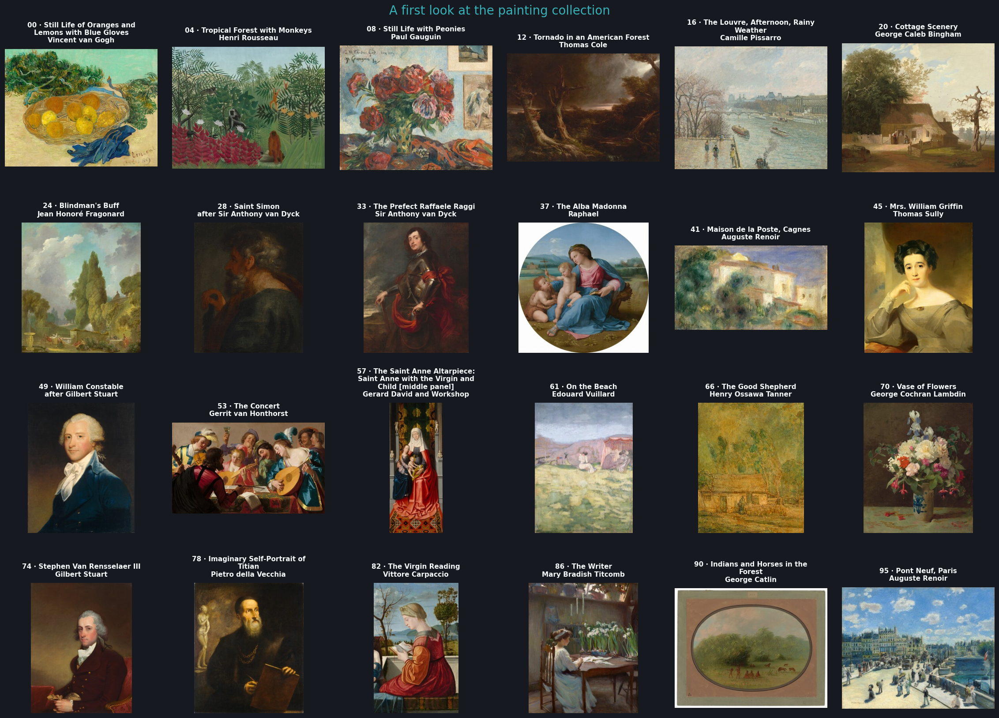

96 paintings ready. Titles and artist names are display metadata only.


In [13]:
# A broad first look, spread across the collection.
preview_indices = np.linspace(0, len(images) - 1, 24, dtype=int)
show_gallery(preview_indices, "A first look at the painting collection", ncols=6)
print(f"{len(images)} paintings ready. Titles and artist names are display metadata only.")

## 2 · Turn each painting into 512 numbers

**ResNet18** is a convolutional neural network pretrained on ImageNet. Its early layers respond to simple visual patterns, while later layers combine patterns across larger areas of an image. We reuse that visual processing without fitting new weights.

The original model ends with a classifier for 1,000 ImageNet categories. We remove that final classifier and keep the preceding representation. After global average pooling, one image becomes a vector of **512 features**. These dimensions are learned numerical features, not named art concepts.

The weights supply the matching image preparation: resize, center crop, convert to a tensor, and normalize the color channels. This matters: the encoder expects images prepared the way its pretrained weights expect. The center crop can also omit details near the edge of a painting.

Finally, divide each vector by its length. Every embedding then has length 1, which makes its dot product with another normalized embedding equal to cosine similarity.

### Keep the visual encoder
ResNet18 has already learned visual features from ImageNet. We load its weights, remove its final classification layer and keep the feature extractor. Each painting becomes **512 numbers**.

`eval()` selects inference behavior. Freezing the parameters prevents gradient updates. `weights.transforms()` supplies the resize, crop and normalization that these weights expect.

In [14]:
weights = ResNet18_Weights.IMAGENET1K_V1
preprocess = weights.transforms()
image_to_tensor = preprocess

backbone = resnet18(weights=weights).to(device).eval()
backbone.requires_grad_(False)
# Keep every stage before the final classifier; flatten (512, 1, 1) to (512,).
encoder = nn.Sequential(*list(backbone.children())[:-1], nn.Flatten()).to(device).eval()
print(f"Reused encoder parameters: {sum(p.numel() for p in encoder.parameters()):,}")
print("New parameters trained on our paintings: 0")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/lenovo/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:01<00:00, 26.8MB/s]

Reused encoder parameters: 11,176,512
New parameters trained on our paintings: 0


### One row per painting
Process a small batch at a time, then collect the vectors in one matrix. A row belongs to a painting; a column is one learned feature.

Finally, divide each vector by its length. With these unit vectors, a dot product gives cosine similarity.

In [15]:
BATCH_SIZE = 16
feature_batches = []
with torch.inference_mode():
    for start in range(0, len(images), BATCH_SIZE):
        batch = torch.stack([preprocess(image) for image in images[start:start + BATCH_SIZE]])
        feature_batches.append(encoder(batch.to(device)).cpu().numpy())

raw_embeddings = np.concatenate(feature_batches, axis=0)
lengths = np.linalg.norm(raw_embeddings, axis=1, keepdims=True)
embeddings = raw_embeddings / np.maximum(lengths, 1e-12)
print(f"{len(images)} images → {embeddings.shape[0]} rows × {embeddings.shape[1]} features")
print(f"Embedding storage: {embeddings.nbytes / 1024:.0f} KB")

96 images → 96 rows × 512 features
Embedding storage: 192 KB


In [16]:
# Keep a NumPy matrix for the small search and plotting steps.
features = embeddings
assert features.shape == (len(paintings), 512)
assert np.allclose(np.linalg.norm(features, axis=1), 1.0, atol=1e-5)
print(f"Search matrix: {features.shape[0]} paintings × {features.shape[1]} features")

Search matrix: 96 paintings × 512 features


### Look inside the embedding matrix

Each row below is one painting and each column is one feature dimension. We show a slice of the matrix so its structure remains visible. Brighter values mean a larger value in that feature; they do **not** measure artistic quality or the probability of a subject.

The model uses all 512 columns when comparing paintings. A feature can contribute to similarity without having an obvious human name.

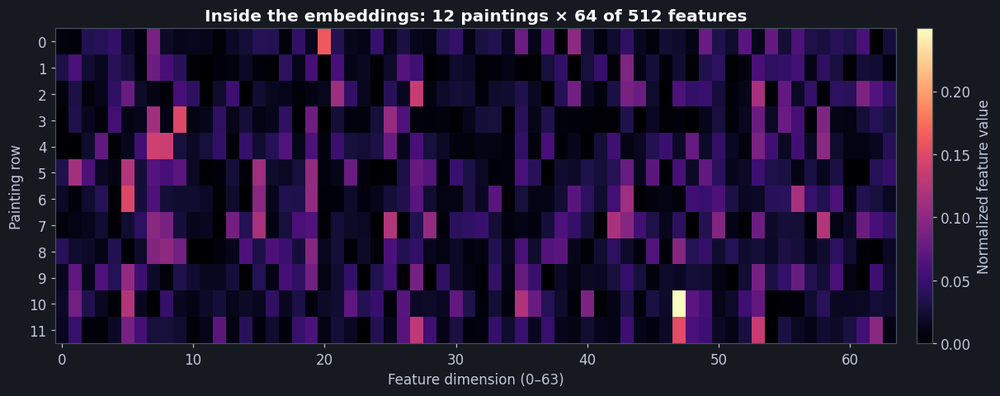

In [17]:
fig, ax = plt.subplots(figsize=(12, 4.5))
heat = ax.imshow(features[:12, :64], aspect="auto", cmap="magma")
ax.set(title="Inside the embeddings: 12 paintings × 64 of 512 features",
       xlabel="Feature dimension (0–63)", ylabel="Painting row")
ax.set_yticks(range(12))
fig.colorbar(heat, ax=ax, label="Normalized feature value", pad=0.02)
plt.tight_layout()
plt.show()

## 3 · Find the nearest paintings

For two unit-length embeddings, cosine similarity is their dot product:

$$s(i,j)=\mathbf{e}_i^\top\mathbf{e}_j.$$

A larger value means the embeddings point in more similar directions. The value is a **similarity score**, not a probability, a percentage match, or a prediction of what someone will like.

For a query painting, calculate its similarity to every painting, exclude the query itself, and sort from highest to lowest. This is exact nearest-neighbor search in the **full 512-dimensional space**. With 96 paintings, a matrix multiplication is all we need.

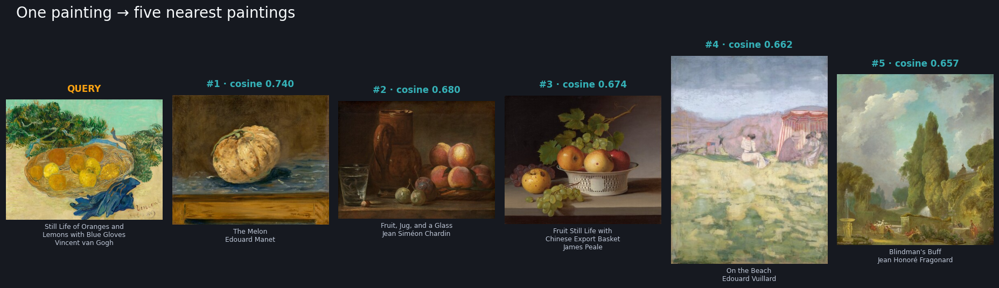

In [18]:
def nearest_paintings(query_index, n=5):
    scores = features @ features[query_index]
    scores[query_index] = -np.inf       # Never recommend the query to itself.
    neighbors = np.argsort(-scores, kind="stable")[:min(n, len(features) - 1)]
    return neighbors, scores[neighbors]


from textwrap import fill


def show_recommendations(query_index, n=5):
    neighbors, scores = nearest_paintings(query_index, n)
    indices = [query_index, *neighbors]
    fig, axes = plt.subplots(1, len(indices), figsize=(17, 5))
    for position, (ax, index) in enumerate(zip(axes, indices)):
        row = paintings.iloc[index]
        ax.imshow(images[index])
        label = "QUERY" if position == 0 else f"#{position} · cosine {scores[position - 1]:.3f}"
        ax.set_title(label, color=AMBER if position == 0 else TEAL, fontsize=11, pad=10)
        ax.set_xlabel(fill(str(row.title), 25) + "\n" + fill(str(row.artist), 25), fontsize=8)
        ax.set_xticks([])
        ax.set_yticks([])
        for spine in ax.spines.values():
            spine.set_visible(False)
    fig.suptitle("One painting → five nearest paintings", fontsize=18, x=0.02, ha="left")
    plt.tight_layout()
    plt.show()
    return neighbors

QUERY_INDEX = 0
neighbors = show_recommendations(QUERY_INDEX)

**Read the pictures alongside the scores.** Look for similar color palettes, textures, composition, or subject matter. A pretrained ImageNet encoder may pick up some of those relationships, but it was not trained to understand painting styles, art history, or a curator's judgment.

The closest match is simply the closest among these 96 images. Even the top result can be visually unconvincing when the collection lacks an appropriate match.

## 4 · Make a visual cloud

We now compress the same 512 features into two coordinates using **principal component analysis (PCA)**. PCA finds directions with the greatest variation in this particular collection. It gives us a readable overview, not a replacement search space.

The axis labels report how much variation each direction retains. If their combined percentage is low, much of the original structure is outside this view. Nearby thumbnails can suggest relationships to inspect; distant thumbnails may still be close in the original embeddings. Neither axis has a preset meaning such as “abstract” or “realistic.”

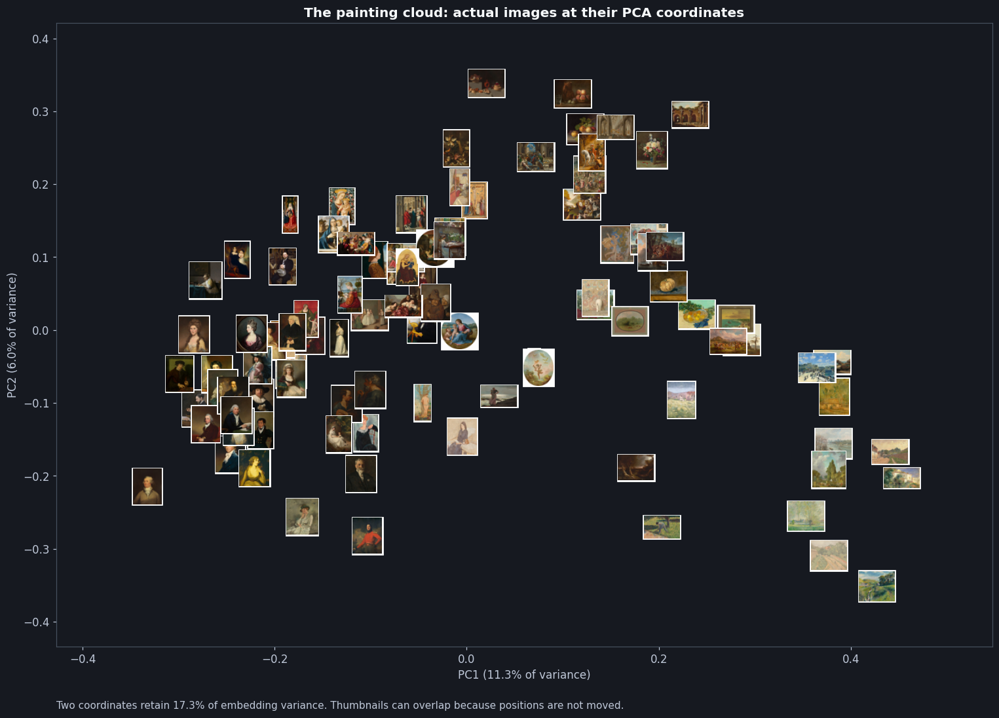

In [19]:
from sklearn.decomposition import PCA
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

pca = PCA(n_components=2, random_state=42)
coordinates = pca.fit_transform(features)
variance = pca.explained_variance_ratio_ * 100
axis_x = f"PC1 ({variance[0]:.1f}% of variance)"
axis_y = f"PC2 ({variance[1]:.1f}% of variance)"

fig, ax = plt.subplots(figsize=(14, 10))
ax.scatter(coordinates[:, 0], coordinates[:, 1], color=TEAL, s=16, alpha=0.35)
for index, (x, y) in enumerate(coordinates):
    thumbnail = images[index].copy()
    thumbnail.thumbnail((48, 48))
    picture = OffsetImage(np.asarray(thumbnail), zoom=0.75)
    ax.add_artist(AnnotationBbox(picture, (x, y), frameon=True, pad=0.08,
                                bboxprops=dict(edgecolor="white", linewidth=0.5)))
ax.margins(0.12)
ax.set(title="The painting cloud: actual images at their PCA coordinates",
       xlabel=axis_x, ylabel=axis_y)
ax.text(0, -0.1, f"Two coordinates retain {variance.sum():.1f}% of embedding variance. "
        "Thumbnails can overlap because positions are not moved.",
        transform=ax.transAxes, fontsize=10, color=MUTED)
plt.tight_layout()
plt.show()

## 5 · Explore visual groups

A cloud becomes easier to browse when we group its paintings. **K-means** divides the collection into `k` groups by assigning each embedding to a nearby group center and updating those centers.

We fit K-means to all **512 normalized features**, not to the two PCA coordinates. No title, artist, date, or genre label enters this calculation. Group numbers are just identifiers. These are exploratory visual groups, not validated art-historical categories, and changing `k` can change their membership.

Start with six groups. The gallery shows paintings nearest each group's center, so you can inspect what the algorithm has put together.

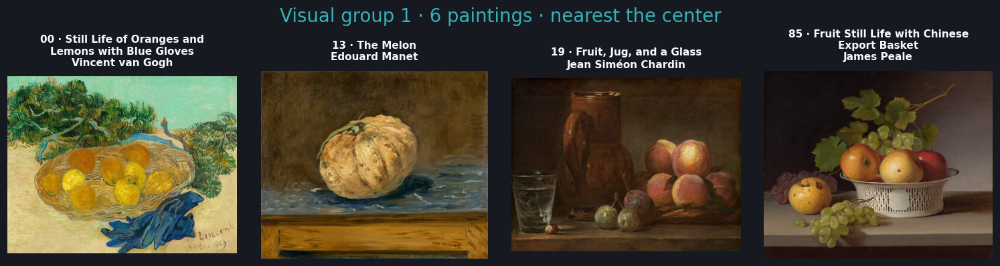

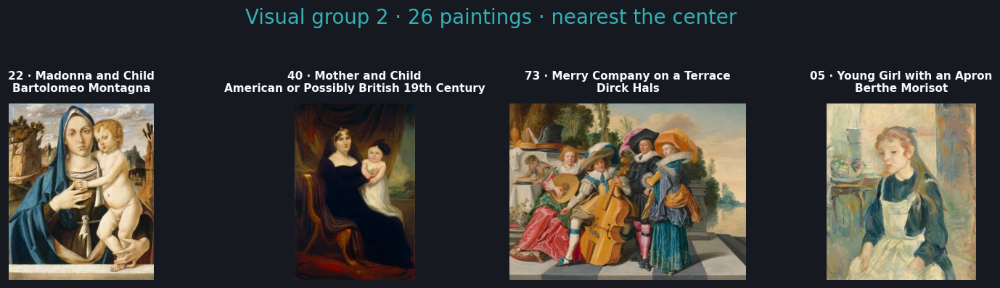

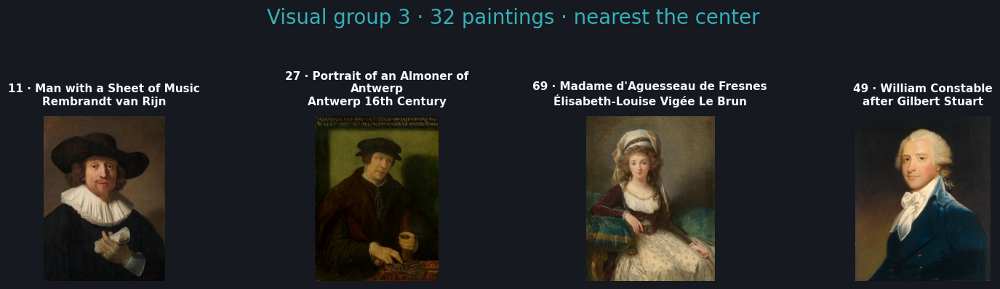

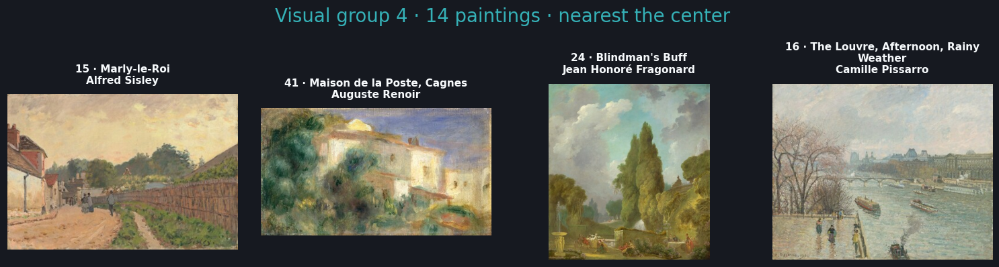

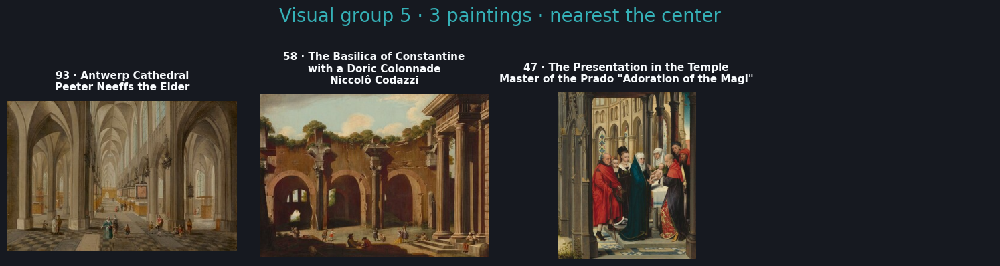

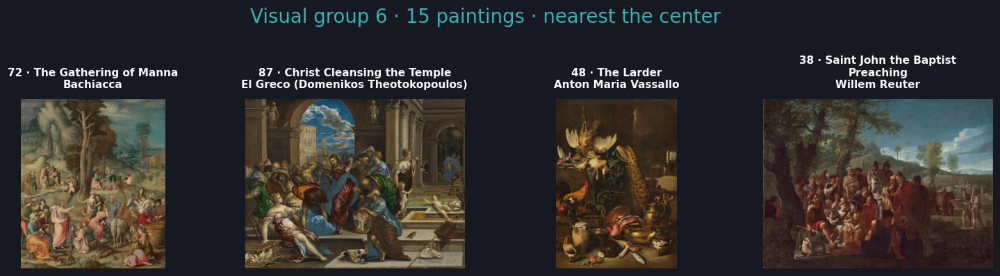

In [20]:
from sklearn.cluster import KMeans

N_GROUPS = 6                        # Experiment: try 4, then 8.
kmeans = KMeans(n_clusters=N_GROUPS, random_state=42, n_init=10)
groups = kmeans.fit_predict(features)

for group in range(N_GROUPS):
    members = np.flatnonzero(groups == group)
    distances = np.linalg.norm(features[members] - kmeans.cluster_centers_[group], axis=1)
    representatives = members[np.argsort(distances)[:4]]
    show_gallery(representatives,
                 f"Visual group {group + 1} · {len(members)} paintings · nearest the center",
                 ncols=4)

## 6 · Browse and recommend interactively

Choose a painting from the dropdown. Its five nearest paintings appear in the gallery, while the cloud marks the query in amber and its neighbors in teal. Hover over any cloud point to read the title, artist and exploratory group.

**Two views, one query:** the gallery shows the images returned by exact search in 512 dimensions; the cloud shows where those same images land after PCA. A recommended neighbor can look far away in the cloud because the projection discards dimensions.

In [21]:
import plotly.graph_objects as go
import plotly.io as pio
import ipywidgets as widgets
from IPython.display import display, clear_output

try:
    from google.colab import output
    output.enable_custom_widget_manager()
    pio.renderers.default = "colab"
except ImportError:
    pio.renderers.default = "plotly_mimetype+notebook_connected"


def make_cloud(query_index=None, neighbors=()):
    custom = np.column_stack([
        paintings["title"].astype(str),
        paintings["artist"].astype(str),
        (groups + 1).astype(str),
    ])
    hover = ("<b>%{customdata[0]}</b><br>%{customdata[1]}"
             "<br>Visual group %{customdata[2]}<extra></extra>")
    figure = go.Figure(go.Scatter(
        x=coordinates[:, 0], y=coordinates[:, 1], mode="markers",
        customdata=custom, hovertemplate=hover, name="Collection",
        marker=dict(size=9, color=groups, colorscale="Viridis", opacity=0.65,
                    line=dict(width=0.5, color="white")),
    ))
    if query_index is not None:
        for indices, label, color, symbol, size in [
            (list(neighbors), "Nearest paintings", TEAL, "circle", 16),
            ([query_index], "Query", AMBER, "star", 22),
        ]:
            figure.add_trace(go.Scatter(
                x=coordinates[indices, 0], y=coordinates[indices, 1], mode="markers",
                customdata=custom[indices], hovertemplate=hover, name=label,
                marker=dict(size=size, color=color, symbol=symbol,
                            line=dict(width=1.5, color="white")),
            ))
    figure.update_layout(
        title=f"Explore the collection · PCA retains {variance.sum():.1f}% of variance",
        xaxis_title=axis_x, yaxis_title=axis_y, height=560,
        paper_bgcolor=BG, plot_bgcolor=BG, font=dict(color=FG),
        margin=dict(l=55, r=25, t=65, b=55),
        legend=dict(orientation="h", y=1.07, x=0),
    )
    figure.update_xaxes(gridcolor="#343c49", zeroline=False)
    figure.update_yaxes(gridcolor="#343c49", zeroline=False)
    return figure


query_dropdown = widgets.Dropdown(
    options=[(f"{i + 1:02d} · {row.title} | {row.artist}", i)
             for i, row in paintings.iterrows()],
    value=QUERY_INDEX, description="Painting:",
    layout=widgets.Layout(width="95%"), style={"description_width": "initial"},
)
explorer_output = widgets.Output()


def update_explorer(change=None):
    with explorer_output:
        clear_output(wait=True)
        query = query_dropdown.value
        neighbors = show_recommendations(query)
        make_cloud(query, neighbors).show()


query_dropdown.observe(update_explorer, names="value")
display(query_dropdown, explorer_output)
update_explorer()

Dropdown(description='Painting:', layout=Layout(width='95%'), options=(('01 · Still Life of Oranges and Lemons…

Output()

## 7 · Try three small experiments

1. **Change the query.** Use the dropdown to compare a portrait with a landscape. Identify a visible feature shared by several neighbors, then find one result that surprises you. Does a close neighbor in the gallery also appear nearby in the cloud?
2. **Change the number of visual groups.** Set `N_GROUPS` to 4, then 8, and rerun Sections 5 and 6. Look at which paintings remain together. Retrieval scores stay the same because the search uses the embeddings, independently of K-means.
3. **Search with a detail crop.** The next cell automatically creates a closer view of the current query painting and searches with it. Compare the returned images with the full-painting query above. Change `CROP_FRACTION` and rerun this cell to explore how composition and visible detail affect the result.

The third experiment supplies a new image view without uploading another file. It uses the same transform and encoder, so no retraining is needed. The original collection remains the search target.

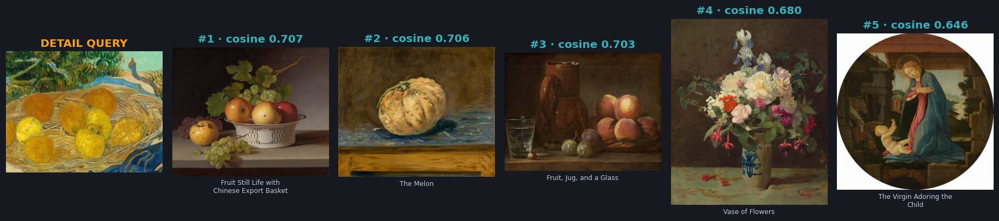

In [22]:
# Create a new query image directly from a painting already in the collection.
CROP_FRACTION = 0.20                # Remove this fraction from every edge.
detail_query = query_dropdown.value
source_image = images[detail_query]
width, height = source_image.size
extra_image = source_image.crop((
    round(width * CROP_FRACTION), round(height * CROP_FRACTION),
    round(width * (1 - CROP_FRACTION)), round(height * (1 - CROP_FRACTION)),
))
tensor = image_to_tensor(extra_image).unsqueeze(0)
with torch.inference_mode():
    extra_embedding = encoder(tensor.to(device)).flatten(1)
    extra_embedding = torch.nn.functional.normalize(extra_embedding, dim=1)
extra_scores = features @ extra_embedding.cpu().numpy()[0]
# Exclude the source painting so we can inspect other paintings.
extra_scores[detail_query] = -np.inf
extra_neighbors = np.argsort(-extra_scores, kind="stable")[:5]

fig, axes = plt.subplots(1, 6, figsize=(17, 5))
axes[0].imshow(extra_image)
axes[0].set_title("DETAIL QUERY", color=AMBER)
for rank, (ax, index) in enumerate(zip(axes[1:], extra_neighbors), 1):
    ax.imshow(images[index])
    ax.set_title(f"#{rank} · cosine {extra_scores[index]:.3f}", color=TEAL)
    ax.set_xlabel(fill(str(paintings.iloc[index].title), 25), fontsize=8)
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
plt.tight_layout()
plt.show()

### Keep the results

The feature file and metadata rows stay in the same order. Model and preprocessing details are included for reuse. The ZIP gathers these files together. The HTML file preserves a hoverable cloud that opens in a browser; the live query dropdown remains part of the notebook.

In Colab, open the **Files** panel and download **visual_art_results.zip**.

In [23]:
from pathlib import Path

export_dir = Path("visual_art_results")
export_dir.mkdir(exist_ok=True)
np.savez_compressed(export_dir / "painting_embeddings.npz",
                    embeddings=features, object_ids=paintings["object_id"].to_numpy())
paintings.assign(visual_group=groups + 1, pc1=coordinates[:, 0], pc2=coordinates[:, 1]).to_csv(
    export_dir / "painting_metadata.csv", index=False)
make_cloud().write_html(export_dir / "painting_cloud.html", include_plotlyjs=True)
(export_dir / "encoder.json").write_text(json.dumps({
    "architecture": "resnet18", "weights": str(weights),
    "feature_layer": "global average pooling before fc", "dimensions": 512,
    "normalization": "L2", "preprocessing": repr(preprocess),
    "torch_version": torch.__version__,
    "search": "cosine similarity in the full normalized embedding space",
}, indent=2))
import shutil
shutil.make_archive(str(export_dir), "zip", export_dir)
print(f"Saved {export_dir}.zip with embeddings, metadata, model details and cloud")

Saved visual_art_results.zip with embeddings, metadata, model details and cloud


## What you built

A content-based image recommender: one image becomes a normalized 512-feature vector, then exact cosine search retrieves visually related paintings from a small collection. PCA makes the collection explorable; K-means offers a second way to browse it. Neither changes how nearest neighbors are calculated.

**Interpreting the results.** ImageNet features, the center crop, reproduction quality and collection selection all affect the results. Visual similarity does not establish common authorship, historical influence, or personal preference.

### Collection and model credits

Paintings and collection metadata: [National Gallery of Art](https://www.nga.gov/), Washington, using its [open collection data](https://github.com/NationalGalleryOfArt/opendata) and IIIF image service. Individual titles, artists, dates, object identifiers and image URLs are retained in `paintings`.

Pretrained encoder and matching image transform: [PyTorch TorchVision ResNet18](https://docs.pytorch.org/vision/stable/models/generated/torchvision.models.resnet18.html). Projection and visual grouping: [scikit-learn PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html) and [KMeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).